<a href="https://colab.research.google.com/github/NazhlyFlorez/Estadistica1/blob/main/Copia_de_Copia_de_pp_estadistica_python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Estadística descriptiva para varibales cuantitativas
En este proyecto se analizará el comportamiento estadístico de variables aleatorias asociadas a un conjunto de datos, estos serán datos univariados, el comportamiento se analizará mediante:

*   Gráficos para datos univariados cuantitativos.
*   Medidas descriptivas para datos univariados cuantitativos.

In [ ]:
# Usamos la función flies.upload función (de google.Colab) se usa Para cargar la base de datos con la que se va a realizar el estudio.
uploaded = files.upload()

Saving nac2022.csv to nac2022.csv


In [ ]:
#Aquí se cargarán todas la librerías que se usarán para crear los respectivos códigos
from google.colab import files
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
from scipy.stats import shapiro
import plotly.express as px
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau

In [ ]:
# añadimos un nuevo elemento llamado "io_csv" la cual tendrá la base de datos que subimos anteiormente, usamos la función Bytes.io (de io) para cargar la
#base de datos a la consola de python
io_csv=io.BytesIO(uploaded['nac2022.csv'])

#Añadimos otro elemento llamado "tablas" que almcenará la base de datos en una estructura de tipo DataFrame, esta es una estructura de datos bidimensional, similar a una tabla, donde las filas representan registros y las columnas representan características o variables
#Para esto se usa la función read_cvs (de pandas) la cual necesita el archivo de la base de datos que es io_csv, la separación de los datos del archivo csv (que en este caso es por comas),
#además de que la primera columna del archivo se tome como un índice (es decir, se usa el argumento index_col=0) y su codificación será 'latin-1' ya que el archivo posee
#letras en latín.
tabla= pd.read_csv(io_csv, sep= ",", index_col=0, encoding='latin-1')

#Si deseamos ver el contenido de la tabla (en este caso queremos ver las 3 primeras filas, entonces ejecutamos el codigo tabla.head(3)), esto sirve para verificar
#que el archivo se subió bien.
tabla.head(3)

<ipython-input-6-a2d79f8e941e>:9: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla= pd.read_csv(io_csv, sep= ",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1


In [ ]:
#Se crea un nuevo elemento llamado "df" (que es un dataframe) a la cual almacenará una parte de la tabla que hicimos anteriormente, es decir, crearemos una subtabla
#en base a la tabla anterior, para esto se usará la variable tabla y de ahí se selccionarán y escribirán las filas con las cuales haremos la subtabla separadas por comas,
#en este caso se selecionarán las variables "EDAD_PADRE": Edad de un padre de un recién nacido en Colombia, "EDAD_MADRE": Edad de una madre de un recién nacido en Colombia y
#"N_EMB":Número de embarazos incluido el presente
df = tabla[["EDAD_PADRE", "EDAD_MADRE", "N_EMB"]]

#Aplicando lo mismo que se le aplicó a la tabla verificamos que estuvieron bien seleccionadas las columnas y que la subtabla se creó de la manera esperada.
df.head(4)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,4


De aquí en adelante se hará el análisis del comportamiento estadístico de la variable "EDAD_PADRE": Edad de un padre de un recién nacido en Colombia.

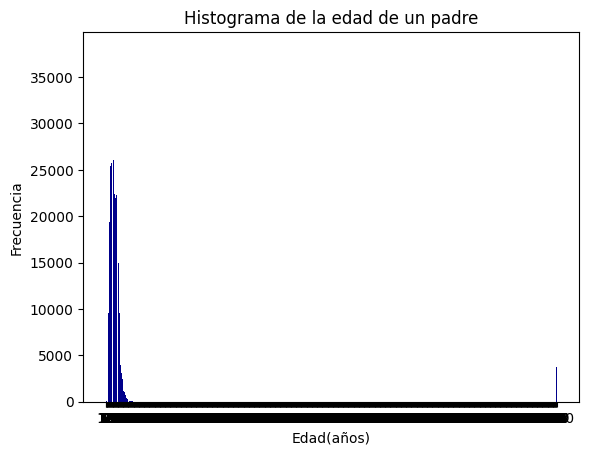

In [ ]:
#Histograma de la edad de un padre de un recién nacido en Colombia, para esto se usarán funciones de la librería matplotlib.pyplot.
#definimos un elemento llamada "intervalos" el cual contendrá los intervalos en los cuales se construirá el histograma, para esto usaremos la función  range la cual va tener
#el valor mínimo y máximo de la variable aleatoria de la subtabla (df.EDAD_PADRE) y se le suma uno al máximo para que se pueda incluir en el rango, también podemos escribir que tan separados estén los extremos de los intervalos que se tratarán, en este caso los extremos de los intervalos
#tendrán una separación de 5 años.
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE) + 2)

#Para construir el histograma se usará la función hist (de matplotlib.pyplot) la cual tendrá en su argumento los siguientes parámetros: la variable aleatoria de la subtabla (df.EDAD_PADRE),
#su separacion (que sería bins) van a ser los intervalos que definimos anteriormente en el elemento "intervalos", el color del histograma que en este caso es "darkblue"
#o azul oscuro y el ancho de sus líneas (que es el parámetro rwidth) será de 0,85.
plt.hist(df.EDAD_PADRE, bins=intervalos, color='darkblue', rwidth=0.85)

#Se usa la función title (de matplotlib.pyplot) para añadir un título al histograma
plt.title('Histograma de la edad de un padre')

#Se usa la función xlabel (de matplotlib.pyplot) para añadir un título al nivel x
plt.xlabel('Edad(años)')

#Se usa la función ylabel (de matplotlib.pyplot) para añadir un título al nivel y
plt.ylabel('Frecuencia')

#Se usa la función xticks (de matplotlib.pyplot) para hacer la división del histograma de acuerdo a los intervalos que se habían definido anteriormente.
plt.xticks(intervalos)

#la función show (de matplotlib.pyplot) muestra el gráfico del histograma
plt.show()

Respecto al histograma anterior, se puede notar que como la separación de los intervalos no se puede ver muy bien entonces sucede que hay valores muy grandes, esto nos dice que ha valores por encima de 100, por ende se eliminarán esos valores ya que son valores atípicos respecto a la edad de un padre de un recién nacido en Colombia.

In [ ]:
#Para eliminar esos valores atípicos crearemos un nuevo elemento llamado "df1", el cuál será una subtabla que sería la misma que la anterior pero sin esos valores
# por ende decimos que cada variable sea menor o diferente de un valor específico separado por un &.
# En este caso decimos que la variable de la edad de un padre sea menor que 120 (df.EDAD_PADRE < 120), la edad de una madre sea diferente de 99 ya que según la base de datos este valor no posee información (df.EDAD_MADRE != 99) y
# el número de embarazos icluido el presente sea diferente de 99 ya que según la base de datos este valor no posee información al respecto (df.N_EMB != 99)
df1=df[(df.EDAD_PADRE<120) & (df.EDAD_MADRE != 99) & (df.N_EMB != 99 )]

#Aplicando lo mismo que se le aplicó a la subtabla anterior verificamos que los valores atípicos y que la subtabla modificada se crearon de la manera esperada.
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,4
76,21,3,1


<ipython-input-10-ea0fe21bf5a6>:34: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label= 'Distribución Normal', color="darkblue")


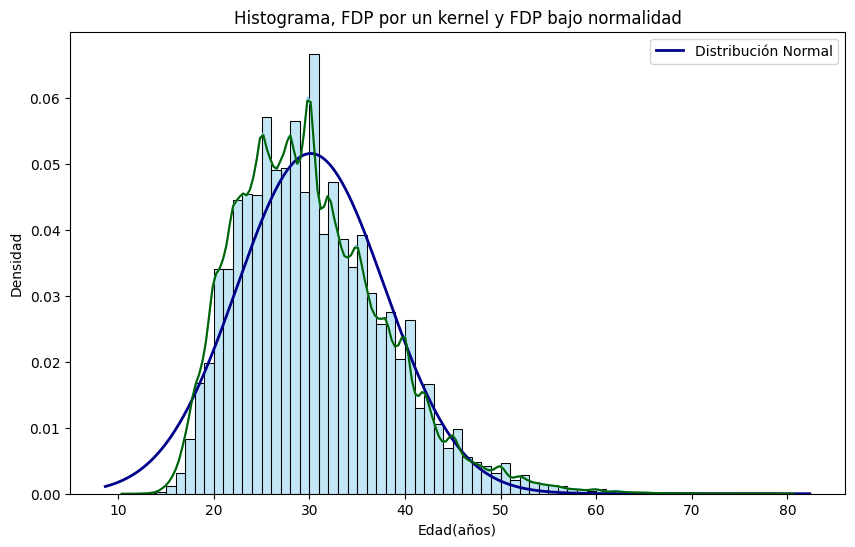

In [ ]:
#Se realizará de nuevo el histograma pero incluyendo algunos parámetros más, se usarán las librerías matplotlib.pyplot y seaborn

#Se calcularán los extremos de los intervalos mediante la función range en el cual se tomará el valor mínimo y el máximo de la variable aleatoria df1.EDAD_PADRE
#y se le suma uno al máximo para que se pueda incluir en el rango.
intervalos1 = range(min(df1.EDAD_PADRE),max(df1.EDAD_PADRE)+1)

#La función figure (de matplotlib.pyplot) sirve para definir el tamaño de la figura, que se determina como (ancho,alto) y su medida es en pulgadas.
plt.figure(figsize=(10,6))

#En este caso usaremos la función hisplot (de seaborn) para realizar el histograma, la función tomará como argumentos x que será df1.EDAD_PADRE que será la columna
#de la subtabla modificada llamada EDAD_PADRE, su separacion (que sería bins) van a ser el intervalo que definimos anteriormente en el elemento "intervalos1",
# kde=True es la gráfica de la estimación de la función de densidad de probabilidad del conjunto de datos (es decir df1.EDAD_PADRE) utilizando un método Kernell,
#stat sería el metodo para la estimación de la función de densidad, es decir estaríamos haciendo la gráfica de la función de densidad y su color sería "skyblue" o "azul cielo"
sns.histplot(x = df1.EDAD_PADRE, bins=intervalos1, kde=True, stat="density", color="skyblue")

#Se realizará el gráfico de la distribución normal respecto al conjunto de datos, se usarán las librerías matplotlib.pyplot, numpy y seaborn

#Se crea un elemento llamado "xmin, xmax" que almacenará los límites del eje x en la gráfica del histograma mediante la función xlim (de matplotlib.pyplot)
xmin, xmax= plt.xlim()

#Se define un elemento llamado "x" el cual va a contener un arreglo de 1000 números que son la disivión en 1000 partes del intervalo [xmin, xmax] (que son los límites del eje x en el histograma), y ese será
#el eje x de la gráfica de la distribución normal, para esto se usa la función linspace (de numpy).
x= np.linspace(xmin, xmax, 1000)

#Se define un elemento llamado "p" el cual contendrá un arreglo que serán los valores de la función de densidad de probabilidad usando los parámetros de la media
#y la desviación estándar para los valores de x, para esto se usa la función norm.pdf (de scipy.stats) donde se usa la función mean (de numpy) para
#calcular la media aritmética de df1.EDAD_PADRE (donde np.mean(df1.EDAD_PADRE)) es su media aritmética y la función std (de numpy) se usa para la calcular la desviación estándar de
#df1.EDAD_PADRE (donde np.std(df1.EDAD_PADRE) es su desviación estándar).
p = norm.pdf(x, np.mean(df1.EDAD_PADRE),np.std(df1.EDAD_PADRE))

#Mediante la función plot (de matplotlib.pyplot) se graficará la distribución normal donde plot tomará como argumentos en el eje x al elemento x, en el eje y al elemento p,
#el ancho de la línea de la gráfica será 2 (es decir linewidth=2), su etiqueta para identificar la gráfica será "Distribución Normal" (es decir label= 'Distribución Normal') y
#el color de la gráfica será "azul oscuro" o "darkblue".
plt.plot(x, p, 'k', linewidth=2, label= 'Distribución Normal', color="darkblue")

#Aquí termina el código de la gráfica de la distribución normal respecto al conjunto de datos

#Esta función (de seaborn) hace que se cambie el color de la estimación por el método kernel de la fución de densidad de probabilidad respecto a la variable df1.EDAD_PADRE
#para que en vez de hacerlo de color cyan (el color del histograma) se haga de otro color para poder diferenciarse mejor.
sns.kdeplot(x=df1.EDAD_PADRE, color= "darkgreen")

#Se usa la función title (de matplotlib.pyplot) para añadir un título al histograma
plt.title('Histograma, FDP por un kernel y FDP bajo normalidad')

#Se usa la función xlabel (de matplotlib.pyplot) para añadir un título al nivel x
plt.xlabel('Edad(años)')

#Se usa la función ylabel (de matplotlib.pyplot) para añadir un título al nivel y
plt.ylabel('Densidad')

#Se usa la función legend (de matplotlib.pyplot) para añadir leyendas
plt.legend()

#la función show (de matplotlib.pyplot) muestra el gráfico del histograma
plt.show()

Sea $X:=$ Edad del padre de un recién nacido en Colombia

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un método kernel (línea verde) no coincide con la función de probabilidad asumiendo el supuesto de normalidad (línea azul), $X\sim \text{Normal} (\text{media}=\bar{x}, \text{varianza}=s^2_x)$, entonces no asumimos normalidad.

**A continuación se hará la prueba de Shapiro-Wilk para reafirmar que no se tiene normalidad en la variable aleatoria de la edad de un padre de un recién nacido en Colombia:**

In [ ]:
#Se usa la función shapiro (de scipy.stats) para calcular el valor que arroja la prueba de Shapiro-Wilk respecto a la variable aleatoria de la edad de un padre de un recién nacido en Colombia.
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568275.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9627148313340553), pvalue=np.float64(1.9197625321099692e-116))

 *   si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%

*   si el **valor p** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue=$1.9197625321099692 \times10^{-116}$ < 0.05, es decir, se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal.

In [ ]:
#Usamos la función count (de pandas) para contar el número de datos no nulos que posee la columna EDAD_PADRE de la subtabla (o dataframe) df1.
df1.EDAD_PADRE.count()

np.int64(568275)

También podríamos reafirmar que se rechaza la hipótesis nula porque como hay 568.275 datos y eso es una cantidad que se considera extensa para realizar el analisis estadístico de la edad de un padre recién nacido en Colombia, por eso se tomará una submuestra del conjunto de datos.

In [ ]:
#Se define un elemento llamado "idx" el cual contiene un array de números aleatorios entre 0 por defecto hasta el número total de datos de la coloumna EDAD_PADRE en la subtabla (o dataframe) df1
#para realizar esto se usa la función random.randint (de numpy) y además se indica cuantos números contiene el array con el argumento size (En este caso es 100), para contar el número de datos de la columna EDAD_PADRE se usa la función len (es nativa de python)
#En este caso idx sería una muestra del conjunto de datos de tamaño 100, donde idx sería el número del padre encuestado.
idx= np.random.randint(len(df1.EDAD_PADRE), size=100)

#Realizamos de nuevo la prueba Shapiro-Wilk para determinar si hay normalidad en la variable aleatoria de la edad de un padre de un recién nacido en Colombia:
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=np.float64(0.8560750897794348), pvalue=np.float64(2.0015188740996616e-08))

Como el valor p (igual a $2.183748265865894 \times10^{-8}$) es menor que 0.05, entonces se rechaza la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal

<Axes: ylabel='EDAD_PADRE'>

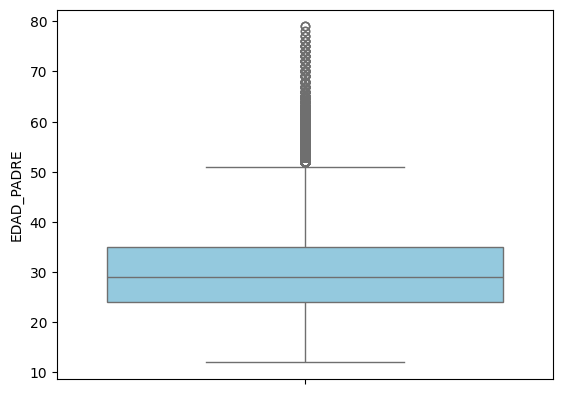

In [ ]:
#Diagrama de cajas y bigotes

#Se usa la función boxplot (de seaborn) para realizar el diagrama de cajas y bigotes usando como argumento df1.EDAD_PADRE, el color que sería "azul cielo" o skyblue y su saturación será de 0.75 (es decir saturation=0.75)
sns.boxplot(df1.EDAD_PADRE,color='skyblue',saturation=0.75)

Según el diagrama de cajas y bigotes, este nos muestra que el menor valor es más o menos en 10 y el mayor es menor o igual a 8, Se considera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor a 50, la media aritmética es cercana a los 30 años, el tercer cuartil es menor a los 35 años y el primer cuartil es mayor o igual a 25.

$\text{Rango intercuartilico = tercer cuartil - primer cuartil} = 35-25 = 10$

El dato mínimo es cercano a 10, y el máximo cercano a 80

In [ ]:
#Diagrama de puntos

#La función figure (de matplotlib.pyplot) sirve para definir el tamaño de la figura, que se determina como (ancho,alto) y su medida es en pulgadas.
plt.figure(figsize=(5, 5))

#Para graficar el diagrama de punto usamos la función strip (de plotly.express) en la cual su argumento es df1.EDAD_PADRE () y su orientation sería de forma horizontal (es decir orientation = 'h')
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')

#La función show (de plotly.express) muestra el gráfico del diagrama de puntos
fig.show()

<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recien nacido en Colombia porque se pueden dar para cualquer grupo de edades entre los 12 y más o menos los 80 años.

In [ ]:
#Cálculo de Medidas Descriptivas, se usarán las librerías numpy y scipy,stats

print(f"Media: {np.mean(df1.EDAD_PADRE)}") #con la función mean (de numpy) se calcula la media aritmética de un conjunto de datos
print(f"Varianza: {np.var(df1.EDAD_PADRE)} y la desviación estándar es de: {np.std(df1.EDAD_PADRE)}") #con la función var se calcula la varianza y con std se calula la desviación estándar (ambas son de numpy)
print(f"Asimetría: {skew(df1.EDAD_PADRE)}") #con la función skew (de scipy.stats) se calcula el coeficiente de asimetría de Fisher
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}") #con la función kurtosis (scipy.stats) se calcula la curtosis de un conjunto de datos


Media: 30.148241608376225
Varianza: 59.92646840062605 y la desviación estándar es de: 7.7412187929696215
Asimetría: 0.7932615019936162
Curtosis: 0.8974407745661472


*   Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 30.14 años.

*   Aproximadamente la distancia entre los valores de la edad de un padre de un recién nacido en Colombia y la media es 7.74 años.

*   La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es myor que la moda en la varibala leatoria ya que el coeficiente de asimetría es mayor a 0.

*   Como la curstosis es menor a 3, es platicurtica, es decir, hay una baja concentración de los valores de las edades de un padre de un recién nacido en Colombia con respecto a la media aritmética.





**De aquí en adelante se hará el análisis del comportamiento estadístico de la variable "N_EMB": Número de embarazos incluido el presente**

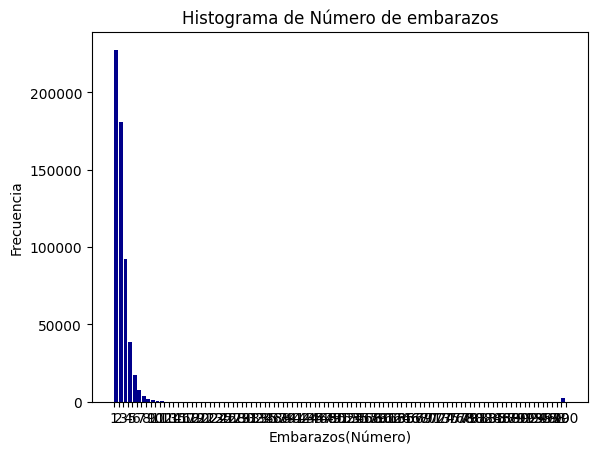

In [ ]:
#Histograma del número de embarazos, para esto se usarán funciones de la librería matplotlib.pyplot.
#Definimos un elemento llamado "intervalos" el cual contendrá los intervalos en los cuales se construirá
#el histograma, para esto usaremos la función range la cual va a tener el valor mínimo y máximo de la variable aleatoria
#de la subtabla (df.N_EMB) y se le suma uno al máximo para que se pueda incluir en el rango. También
#podemos escribir qué tan separados estén los extremos de los intervalos que se tratarán, en este caso los extremos tendrán una separación de 1 unidad.
intervalos = range(min(df.N_EMB), max(df.N_EMB) + 2)

#Para construir el histograma se usará la función hist (de matplotlib.pyplot) la cual tendrá en su argumento los siguientes parámetros:
#la variable aleatoria de la subtabla (df.N_EMB), su separación (que sería bins) serán los intervalos definidos anteriormente en el elemento "intervalos",
#el color del histograma que en este caso es "darkblue" o azul oscuro y el ancho de sus barras (que es el parámetro rwidth) será de 0.85.
plt.hist(df.N_EMB, bins=intervalos, color='darkblue', rwidth=0.85)
plt.hist(df.N_EMB, bins=intervalos, color='darkblue', rwidth=0.85)

#Se usa la función title (de matplotlib.pyplot) para añadir un título al histograma
plt.title('Histograma de Número de embarazos')

#Se usa la función xlabel (de matplotlib.pyplot) para añadir un título al nivel x
plt.xlabel('Embarazos(Número)')

#Se usa la función ylabel (de matplotlib.pyplot) para añadir un título al nivel y
plt.ylabel('Frecuencia')

#Se usa la función xticks (de matplotlib.pyplot) para hacer la división del histograma de acuerdo a los intervalos que se habían definido anteriormente.
plt.xticks(intervalos)

#la función show (de matplotlib.pyplot) muestra el gráfico del histograma
plt.show()

Respecto al histograma anterior, se observa que la mayoría de los datos se concentran entre 0 y 5 embarazos. Sin embargo, existen algunos valores extremos por encima de 30, e incluso mayores a 100, que no son comunes ni esperables en un contexto real. Esto indica la presencia de valores atípicos, por lo cual se considera apropiado eliminarlos para un análisis más representativo del número de embarazos en la población.

<ipython-input-18-f3b1232a67dc>:36: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



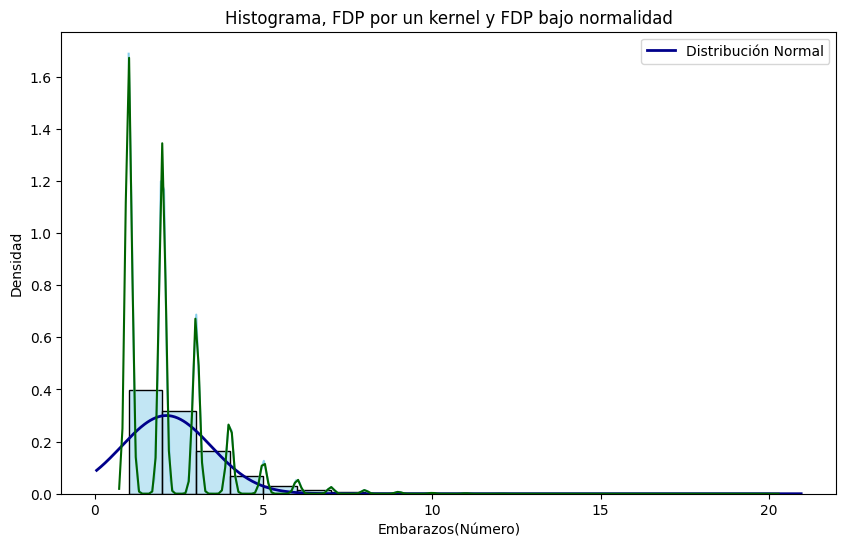

In [ ]:
#Se realizará de nuevo el histograma pero incluyendo algunos parámetros más, se usarán las librerías matplotlib.pyplot y seaborn

# Se calcularán los extremos de los intervalos mediante la función range, usando el mínimo y el máximo de la variable df1.N_EMB.
# Se le suma 1 al máximo para que el último valor quede incluido.
intervalos1 = range(min(df1.N_EMB),max(df1.N_EMB)+1)

# Se define el tamaño de la figura (ancho=10 pulgadas, alto=6 pulgadas) con plt.figure().
plt.figure(figsize=(10,6))

# Se grafica un histograma de la variable df1.N_EMB usando histplot de seaborn.
# - x=df1.N_EMB: columna a graficar.
# - bins=intervalos1: separación entre barras (usando los intervalos definidos).
# - kde=True: incluye la estimación de densidad mediante kernel.
# - stat="density": normaliza el histograma para representar densidad.
# - color="skyblue": color azul cielo para las barras.
sns.histplot(x = df1.N_EMB, bins=intervalos1, kde=True, stat="density", color="skyblue")

#Se realizará el gráfico de la distribución normal respecto al conjunto de datos, se usarán las librerías matplotlib.pyplot, numpy y seaborn

#Se crea un elemento llamado "xmin, xmax" que almacenará los límites del eje x en la gráfica del histograma mediante la función xlim (de matplotlib.pyplot)
xmin, xmax= plt.xlim()

#Se define un elemento llamado "x" el cual va a contener un arreglo de 1000 números que son la disivión en 1000 partes del intervalo [xmin, xmax] (que son los límites del eje x en el histograma), y ese será
#el eje x de la gráfica de la distribución normal, para esto se usa la función linspace (de numpy).
x= np.linspace(xmin, xmax, 1000)

# Se calcula la función de densidad de la distribución normal para los valores de x,
# usando como media y desviación estándar las de la variable df1.N_EMB.
p = norm.pdf(x, np.mean(df1.N_EMB),np.std(df1.N_EMB))

# Se grafica la curva de la distribución normal con los valores x y p.
# - 'k' indica que el estilo de línea es negro.
# - linewidth=2 define el grosor de la curva.
# - label='Distribución Normal' añade una leyenda identificadora.
# - color="darkblue" especifica el color azul oscuro.
plt.plot(x, p, 'k', linewidth=2, label= 'Distribución Normal', color="darkblue")

#Aquí termina el código de la gráfica de la distribución normal respecto al conjunto de datos

# Se vuelve a graficar la estimación KDE para la variable df1.N_EMB en color verde oscuro,
# para diferenciarla del histograma.
sns.kdeplot(x=df1.N_EMB, color= "darkgreen")

#Se usa la función title (de matplotlib.pyplot) para añadir un título al histograma
plt.title('Histograma, FDP por un kernel y FDP bajo normalidad')

#Se usa la función xlabel (de matplotlib.pyplot) para añadir un título al nivel x
plt.xlabel('Embarazos(Número)')

#Se usa la función ylabel (de matplotlib.pyplot) para añadir un título al nivel y
plt.ylabel('Densidad')

#Se usa la función legend (de matplotlib.pyplot) para añadir leyendas
plt.legend()

#la función show (de matplotlib.pyplot) muestra el gráfico del histograma
plt.show()

Sea X := Número de embarazos en una mujer en Colombia.

Descriptivamente, como la función de densidad de probabilidad estimada mediante un método kernel (línea verde) no coincide con la función de probabilidad bajo el supuesto de normalidad (línea azul), entonces no asumimos que X ∼ Normal(media = x̄, varianza = s²ₓ).

In [ ]:
# Se usa la función shapiro (de scipy.stats) para hacer la prueba de normalidad Shapiro-Wilk sobre la variable df1.N_EMB.
shapiro(df1.N_EMB)

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568275.



ShapiroResult(statistic=np.float64(0.7748883936530082), pvalue=np.float64(5.4172799889202605e-173))

Si el valor p en una prueba de hipótesis es menor que 0.05, se rechaza la hipótesis nula con una confianza del 95%. En nuestro caso, el valor p obtenido fue p-value = 5.42×10⁻¹⁷³ < 0.05, por lo tanto, se rechaza la hipótesis nula. Es decir, se concluye que la variable aleatoria “número de embarazos en mujeres en Colombia” no sigue una distribución normal.

Nota: Aunque el tamaño de la muestra es muy grande (N = 568275) y se advierte que el p-valor puede no ser exacto, el resultado sigue indicando una fuerte evidencia contra la normalidad.

In [ ]:
# Usamos la función count (de pandas) para contar el número de datos no nulos que posee la columna N_EMB de la subtabla (o dataframe) df1.
# count() devuelve la cantidad de valores no nulos en la columna N_EMB de df1, excluyendo cualquier valor nulo (NA).
df1.N_EMB.count()

np.int64(568275)

También podríamos reafirmar esta decisión considerando que se tienen 568.275 datos, lo cual representa una muestra suficientemente grande para realizar un análisis estadístico confiable del número de embarazos en la población.

Nota: el valor np.int64(568275) corresponde al tipo de dato que representa el tamaño total de la muestra.


In [ ]:
# Se define un elemento llamado "idx" el cual contiene un array de números aleatorios entre 0 y el número total de datos
# de la columna N_EMB en la subtabla (o dataframe) df1.
# Para hacer esto, usamos la función random.randint (de numpy) que genera números enteros aleatorios.
# Además, indicamos que queremos un array con 100 números aleatorios usando el argumento "size" (En este caso es 100).
# Para contar el número total de datos de la columna N_EMB, utilizamos la función len(), que es nativa de Python.
# De esta manera, idx será un conjunto de índices aleatorios que nos permitirá obtener una muestra aleatoria de 100 datos de N_EMB.
idx= np.random.randint(len(df1.N_EMB), size=100)

# Realizamos de nuevo la prueba Shapiro-Wilk para determinar si hay normalidad en la variable aleatoria de N_EMB.
# Para hacer esto, pasamos el índice aleatorio "idx" a df1.N_EMB para extraer una muestra de 100 elementos de la columna N_EMB.
# La prueba Shapiro-Wilk nos ayudará a verificar si esta muestra sigue una distribución normal.
# Realiza la prueba de normalidad sobre la muestra de 100 datos de N_EMB
shapiro(df1.N_EMB.index[idx])

ShapiroResult(statistic=np.float64(0.8583629010470489), pvalue=np.float64(2.4462806718643574e-08))

Como el valor p (igual a 2.45×10⁻⁸) es menor que 0.05, entonces se rechaza la hipótesis nula. Es decir, se concluye que la variable aleatoria “número de embarazos en mujeres en Colombia” no sigue una distribución normal.

<Axes: ylabel='N_EMB'>

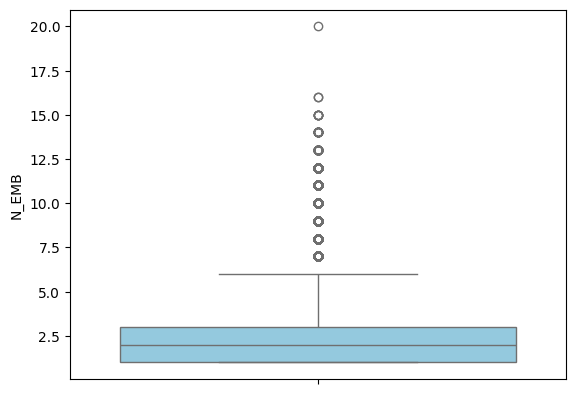

In [ ]:
#Diagrama de cajas y bigotes

# Se usa la función boxplot (de seaborn) para realizar un diagrama de cajas y bigotes,
# utilizando como argumento la columna N_EMB de la subtabla (o dataframe) df1.
# El diagrama de cajas y bigotes es útil para visualizar la distribución de los datos,
# identificar valores atípicos y observar la mediana, cuartiles y rango de la variable N_EMB.

# Para personalizar el color del diagrama, se elige el color "azul cielo" o "skyblue".
# La saturación del color se establece en 0.75 (es decir, saturation=0.75), lo que hace que el color sea ligeramente menos intenso.
sns.boxplot(df1.N_EMB,color='skyblue',saturation=0.75)

Según el diagrama de cajas y bigotes, la mayoría de los valores del número de embarazos en mujeres en Colombia se concentra entre aproximadamente 1 y 5. El primer cuartil está cerca de 1, la mediana cerca de 2, y el tercer cuartil alrededor de 3.

El rango intercuartílico (RIC) es aproximadamente 3 - 1 = 2.
Se observan varios valores atípicos por encima de 6 embarazos, llegando hasta un máximo cercano a 20. Estos valores extremos se representan con círculos por encima del bigote superior, lo cual indica que son datos atípicos según la regla de 1.5 veces el RIC.

In [ ]:
#Diagrama de puntos

# La función figure (de matplotlib.pyplot) se usa para definir el tamaño de la figura,
# donde el tamaño se especifica como una tupla (ancho, alto) en pulgadas.
# En este caso, se ha establecido el tamaño de la figura a 5 pulgadas de ancho y 5 pulgadas de alto.
plt.figure(figsize=(5, 5))

# Para graficar el diagrama de puntos, utilizamos la función strip (de plotly.express).
# Esta función toma como argumento la columna N_EMB de la subtabla (o dataframe) df1.
# Además, se establece la orientación del gráfico como horizontal, utilizando el parámetro "orientation = 'h'".
# El diagrama de puntos es útil para ver la distribución de los datos a lo largo de una dimensión.
fig = px.strip(df1.N_EMB, orientation = 'h')

# Finalmente, la función show (de plotly.express) muestra el gráfico del diagrama de puntos en pantalla.
fig.show()

<Figure size 500x500 with 0 Axes>

De acuerdo con el diagrama de puntos, se observa una alta variabilidad en el número de embarazos en mujeres en Colombia. Aunque la mayoría de los valores se concentran entre 1 y 10 embarazos, también se encuentran casos más extremos, incluso con 20 embarazos. Esto indica que existen valores atípicos y que la variable presenta una dispersión considerable.

In [ ]:
#Cálculo de Medidas Descriptivas, se usarán las librerías numpy y scipy,stats

print(f"Media: {np.mean(df1.N_EMB)}") # Media: calculamos el promedio de los datos de la columna N_EMB.
print(f"Varianza: {np.var(df1.N_EMB)} y la desviación estándar es de: {np.std(df1.N_EMB)}") # Varianza y desviación estándar: medimos la dispersión de los datos de N_EMB.
print(f"Asimetría: {skew(df1.N_EMB)}") # Asimetría: calculamos el coeficiente de asimetría de la columna N_EMB, mide la simetría de la distribución.
print(f"Curtosis: {kurtosis(df1.N_EMB)}") # Curtosis: medimos el "pico" de la distribución de los datos de N_EMB.

Media: 2.1172478113589372
Varianza: 1.770862514761054 y la desviación estándar es de: 1.3307375829821046
Asimetría: 1.9148308460730108
Curtosis: 5.941768750953573


Aproximadamente, el número promedio de embarazos en mujeres en Colombia es de 2.12.
La desviación estándar es de 1.33, lo que indica que, en promedio, los valores del número de embarazos se alejan 1.33 unidades de la media.
La distribución es asimétrica positiva, ya que la asimetría es mayor a 0 (1.91), lo que indica que hay más valores concentrados a la izquierda y una cola más larga hacia la derecha (embarazos más altos).
La curtosis es mayor a 3 (5.94), por lo tanto, se trata de una distribución leptocúrtica, es decir, hay una alta concentración de valores cercanos a la media y colas más pesadas que una distribución normal.

En esta sección de la parte práctica se hará estadísitica descriptiva en datos bivariados, es decir, se tomarán dos variables cuantitativas y se compararán entre sí para saber si hay dependencia o correlación entre ambas variables.

*   Una variable depende de la otra, cuando la ejecución de esta depende de la variable independiente.

*Ejemplo*: El precio de una vivienda depende su número de habitaciones, ya que entre más habitaciones mayor es su precio.

*   Una variable está correlacionada con otra, cuando guardan cierta relación, pero no es posible hablar de cierta dependencia.

*Ejemplo*: Consumo de arroz y de carne, ya que se ha visto ya que al comer más arroz se come más carne pero no hay dependencia entre estas dos variables.

Para determinar si una variable está correlacionada o depende de otra variable usaremos un diagrama de dispersión y una recta para datos bivariados.

¿Qué son datos bivariados?
Los datos bivariados son aquellos que provienen de dos variables medidas al mismo tiempo sobre cada individuo, en este caso tendríamos la edad de un padre de un recién nacido en Colombia y el número de embarazos incluido el presente en Colombia.

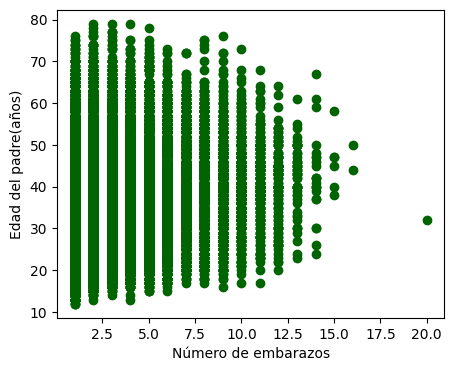

In [ ]:
#Diagrama de dispersión, usaremos la librería matplotlib.pyplot

#Esta función (de matplotlib.pyplot)sirve para definir el tamaño de la figura, es (ancho,alto) y su medida es en pulgadas
plt.figure(figsize=(5,4))

# Esta función (de matplotlib.pyplot) se usa para hacer el gráfico de dispersión donde (df1['N_EMB'],df1['EDAD_PADRE'])
#representan los ejes x y y en el gráfico, también da la opción de escoger el color con el cual se representarán los datos y marker indica si los puntos del gráfico
#están rellenos o no
plt.scatter(df1['N_EMB'],df1['EDAD_PADRE'], color = "darkgreen", marker= "o")

#Estas funciones (de matplotlib.pyplot) se usan para nombrar el eje x y y en el gráfico de dispersión
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre(años)')

#Con esta función (de matplotlib.pyplot) se muestra el gráfico que se realizó anteriormente
plt.show()


Se observa en el diagrama de dispersión que hay una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadas, para nuestro ejemplo quiere decir que el número de embarazos incluido el presente y la edad de un padre de un recién nacido en Colombia no están correlacionados a grandes rasgos, esto quiere decir que puede que haya un padre joven que haya embarazado a muchas mujeres o un padre mayor que haya embarazado a muy pocas mujeres.

In [ ]:
#Para ver la tendencia de los datos bivariados usaremos la recta de regresión lineal, implementaremos un modelo de regresión lineal simple

#Modelo de regresión lineal simple, usaremos las librerías sklearn.linear_model y numpy para ajustar el modelo de regresión lineal al conjunto de datos

#Definición del modelo de regresión lineal para el conjunto de datos
modelo = LinearRegression()

#La función fit (de sklearn.linear_model) sirve para ajustar el conjunto de datos al modelo de regresión lineal, para usarla debemos convertir los datos en un arreglo tipo numpy usando
#np.array(), y luego las reescalamos en un rango de (-1,1) con la función reshape(-1,1) (de numpy).
modelo.fit(np.array(df1.N_EMB).reshape(-1,1), np.array(df1.EDAD_PADRE).reshape(-1,1))

#la función predict (de sklearn.linear_model) calcula la predicción de la variable x, por ende tendríamos la predicción del modelo de regrewsión lineal asociado a los datos
predi_lineal = modelo.predict(np.array(df1.N_EMB).reshape(-1,1))

#Ejecutamos la función para que nos muestre y almacene las predicciones
predi_lineal

array([[29.91361677],
       [29.91361677],
       [33.91582084],
       ...,
       [29.91361677],
       [31.91471881],
       [29.91361677]])

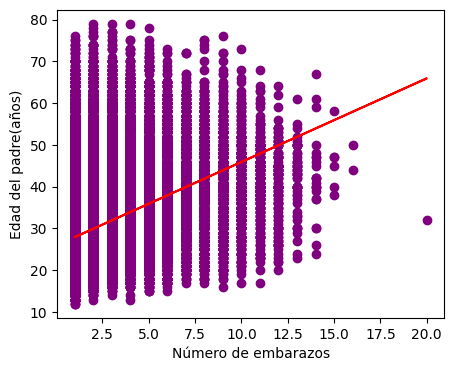

In [ ]:
#Graficando la predicción del modelo de regresión lineal

#Se traza de nuevo el diagrama de dispersión, se usa otro color para poder identificarlos a ambos

#Esta función (de matplotlib.pyplot) sirve para definir el tamaño de la figura, es (ancho,alto) y su medida es en pulgadas
plt.figure(figsize=(5,4))

# Esta función (de matplotlib.pyplot) se usa para hacer el gráfico de dispersión donde (df1['N_EMB'],df1['EDAD_PADRE'])
#representan los ejes x y y en el gráfico, también da la opción de escoger el color con el cual se representarán los datos y marker indica si los puntos del gráfico
#están rellenos o no
plt.scatter(df1['N_EMB'],df1['EDAD_PADRE'], color = "purple", marker= "o")

#Se usa la función plot (de matplotlib.pyplot) para graficar la recta de regresión, donde el eje x es el número de embarazos, el eje y son las predicciones, el tipo de línea es una
#línea recta y su color será rojo.
plt.plot(df1.N_EMB, predi_lineal, linestyle= '-', color = "red")

#Estas funciones (ambas de matplotlib.pyplot) se usan para nombrar el eje x y y en el gráfico de dispersión
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre(años)')

#Con esta función (de matplotlib.pyplot) se muestra el gráfico que se realizó anteriormente
plt.show()

De acuerdo con la recta de regresión mostrada anteriormente se determina una correlación positiva,es decir, los valores de las dos variables aleatorias(número de embarazos y edad de un padre de un recién nacido en Colombia) aumentan juntas, ya que entre más veces un hombre embaraza a una mujer más años tiene esa persona.

In [ ]:
#Se calcularán los coeficientes de correlación de Pearson, de Kendall y de Spearman para determinar el grado de correlación de las variables aleatorias
# se usarán las librerías numpay y scipy.stats para calcularlas

#La función (de numpy) corrcoef sirve para calcular el coeficiente de correlación de Pearson
#Para esto se añaden las variables aleatorias separadas por una coma, como el coeficiente de correrelación de pearson genera un arreglo, entonces seleccionaremos
#el elemento que se encuentra en la fila 1 y la columna 2, como python cuenta desde 0 entonces seleccionamos el elemento [0,1] y  añadimos [0,1] al lado de la función
coef_pearson = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0,1]

#La función spearmanr (de scipy.stats) sirve para calcular el coeficiente de correlación de Spearman, para esto hacemos lo mismo que con el calculo del coeficiente
#anterior pero a excepción de que este genera un vector de 2 elementos, el primer elemento es el valor que queremos calcular y el segundo elemento es un valor P,
#para esto, hacemos que el segundo elemento de la variable que definimos como coef_spearman no tenga valor para esto le añadimos una coma y un guión bajo.
coef_spearman,_ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])

#La función kendalltau (de scipy.stats) sirve para calcular el coeficiente de correlación de Kendall, para esto replicamos lo mismo que hicimos con el
#coeficiente de Spearman
coef_kendall,_ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])

#Imprimiendo los coeficientes de correlación mediante la función print
print(f"Los coeficiente de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall} ")

Los coeficiente de Pearson, Spearman y Kendall son respectivamente 0.3439951455825617, 0.37090856312889686 y 0.2893028390171599 


Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:

Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174. [Link](https://www.jstor.org/stable/2529310)



*   X y Y son independientes ó no están correlacionadas si $\rho(X,Y)\approx 0, \eta(X,Y) \approx 0, \kappa(X,Y) \approx 0$
*   Y depende insignificamtivamente de X ó X y y están insignificativamente correlacionadas si $0 < \vert \rho(X,Y) \vert < 0.2 $ , $0 < \vert \eta(X,Y) \vert < 0.2 $ , $0 < \vert \kappa(X,Y) \vert < 0.2 $.
*   Y depende discretamente de x ó x y y están discretamente correlacionadas si $0.2 < \vert \rho(X,Y) \vert < 0.4 $, $0.2 < \vert \eta(X,Y) \vert < 0.4 $ , $0.2 < \vert \kappa(X,Y) \vert < 0.4$.
*   Y depende moderadamente de x ó x y y están moderadamente correlacionadas si $0.4 < \vert \rho(X,Y) \vert < 0.6 $ , $0.4 < \vert \eta(X,Y) \vert < 0.6 $ , $0.4 < \vert \kappa(X,Y) \vert < 0.6 $.
*   Y depende sustancialmente de x ó x y y están sustancialmente correlacionadas si $0.6 < \vert \rho(X,Y) \vert < 0.8 $ , $0.6 < \vert \eta(X,Y) \vert < 0.8 $ , $0.6 < \vert \kappa(X,Y) \vert < 0.8 $.
*   Y depende fuertemente de x ó x y y están fuertemente correlacionadas si $0.8 < \vert \rho(X,Y) \vert < 1 $ , $0.8 < \vert \eta(X,Y) \vert < 1 $ , $0.8 < \vert \kappa(X,Y) \vert < 1 $.


De acuerdo con los coeficientes de correlación de Pearson, Spearman y Kendall se determina que el número de embarazos incluido el presente y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas ya que los valores de los tres coeficientes se encuentran entre 0.2 y 0.4.

Respondiendo a la pregunta ¿Cómo se comporta la variable aleatoria de la edad de un padre recién nacido en Colombia (EDAD_PADRE)? La variable aleatoria EDAD_PADRE, que representa la edad del padre al momento del nacimiento de su hijo en Colombia, presenta una distribución asimétrica hacia la izquierda. Esto indica que la mayoría de los padres tienen edades jóvenes, concentrándose principalmente alrededor de la media. Además, se observa que las edades menos frecuentes son las menores a 19 años, lo que sugiere que hay pocos padres adolescentes. La mayoría de los datos están agrupados cerca del valor central, y en menor proporción en edades extremas.

¿Cómo se comporta la variable aleatoria del número de embarazos incluido el presente (N_EMB)?
La variable aleatoria presenta una distribución asimétrica hacia la izquierda. Esto quiere decir que la mayoría de los datos se acumulan en los valores más bajos des histograma. La mitad de los datos se concentran entre 1 y 2 embarazos, y hay una diferencia notable entre tener 2 y 3 embarazos. Además, la mayoría de los valores está cerca de la media, mientras que hay pocos casos con números de embarazos muy altos.

En conclusión, respondiendo a la pregunta: ¿Están correlacionadas y que grado de correlación tienen ambas variables?
tomando como relación entre el numero de embarazos y la edad del padre se calculan 3 coeficientes de relación  Pearson (ρ ≈ 0.27), Spearman (η ≈ 0.29) y Kendall (τ ≈ 0.22) todos estos datos se encuentran en un  previo rando de intervalo 0.2-0.4. Analizando los datos presentados por medio de la escala de Koch esto indica que existe una correlación de  forma discreta basando en la recta de regresión, es importante notar que no hay relación en el diagrama de dispersión pero según la recta tenemos una relación es decir con las variables presentas existen casos donde la tasa de embarazo es mayor es dada por progenitor joven es mayor a las de un progenitor de mayor edad.